In [132]:
%load_ext autoreload
%autoreload 2

In [73]:
import numpy as np
import pandas as pd
from pathlib import Path

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
import matplotlib.pyplot as plt
import seaborn as sns    
import missingno

import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff

In [35]:
!pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension

# import datasets

In [111]:
train = pd.read_csv('./in/train.csv', index_col='id')
test = pd.read_csv('./in/test.csv', index_col='id')
train.head()

,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,target
id,,,,,,,,,,,,,,,,,,,,,
1,A,B,A,A,B,D,A,E,C,I,...,0.881122,0.421650,0.741413,0.895799,0.802461,0.724417,0.701915,0.877618,0.719903,6.994023
2,B,A,A,A,B,B,A,E,A,F,...,0.440011,0.346230,0.278495,0.593413,0.546056,0.613252,0.741289,0.326679,0.808464,8.071256
3,A,A,A,C,B,D,A,B,C,N,...,0.914155,0.369602,0.832564,0.865620,0.825251,0.264104,0.695561,0.869133,0.828352,5.760456
4,A,A,A,C,B,D,A,E,G,K,...,0.934138,0.578930,0.407313,0.868099,0.794402,0.494269,0.698125,0.809799,0.614766,7.806457
6,A,B,A,A,B,B,A,E,C,F,...,0.382600,0.705940,0.325193,0.440967,0.462146,0.724447,0.683073,0.343457,0.297743,6.868974


In [145]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 300000 entries, 1 to 499999
Data columns (total 25 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   cat0    300000 non-null  object 
 1   cat1    300000 non-null  object 
 2   cat2    300000 non-null  object 
 3   cat3    300000 non-null  object 
 4   cat4    300000 non-null  object 
 5   cat5    300000 non-null  object 
 6   cat6    300000 non-null  object 
 7   cat7    300000 non-null  object 
 8   cat8    300000 non-null  object 
 9   cat9    300000 non-null  object 
 10  cont0   300000 non-null  float64
 11  cont1   300000 non-null  float64
 12  cont2   300000 non-null  float64
 13  cont3   300000 non-null  float64
 14  cont4   300000 non-null  float64
 15  cont5   300000 non-null  float64
 16  cont6   300000 non-null  float64
 17  cont7   300000 non-null  float64
 18  cont8   300000 non-null  float64
 19  cont9   300000 non-null  float64
 20  cont10  300000 non-null  float64
 21  cont11  30

# column extraction

In [95]:
categorical_cols = train.columns[np.where(train.dtypes==np.object)[0]]
continuous_cols = train.drop('target', 1).columns[np.where(train.drop('target', 1).dtypes!=np.object)[0]]
num_cols = train.drop('target', 1).shape[1]

In [151]:
# change 'object' data types to 'category'
train[categorical_cols] = train[categorical_cols].astype('category')
test[categorical_cols] = test[categorical_cols].astype('category')
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 300000 entries, 1 to 499999
Data columns (total 25 columns):
 #   Column  Non-Null Count   Dtype   
---  ------  --------------   -----   
 0   cat0    300000 non-null  category
 1   cat1    300000 non-null  category
 2   cat2    300000 non-null  category
 3   cat3    300000 non-null  category
 4   cat4    300000 non-null  category
 5   cat5    300000 non-null  category
 6   cat6    300000 non-null  category
 7   cat7    300000 non-null  category
 8   cat8    300000 non-null  category
 9   cat9    300000 non-null  category
 10  cont0   300000 non-null  float64 
 11  cont1   300000 non-null  float64 
 12  cont2   300000 non-null  float64 
 13  cont3   300000 non-null  float64 
 14  cont4   300000 non-null  float64 
 15  cont5   300000 non-null  float64 
 16  cont6   300000 non-null  float64 
 17  cont7   300000 non-null  float64 
 18  cont8   300000 non-null  float64 
 19  cont9   300000 non-null  float64 
 20  cont10  300000 non-null  f

# search for missing values & replace as needed

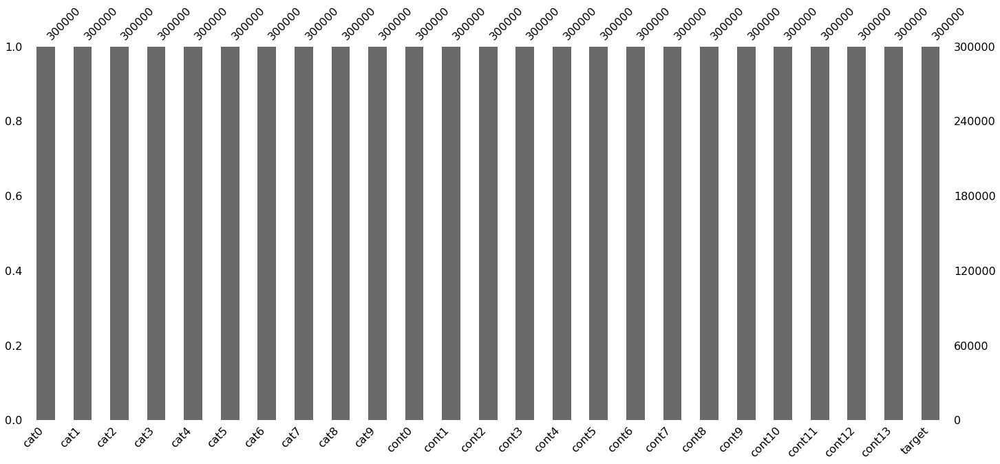

In [28]:
missingno.bar(train);

no null values

# EDA

## pairplot

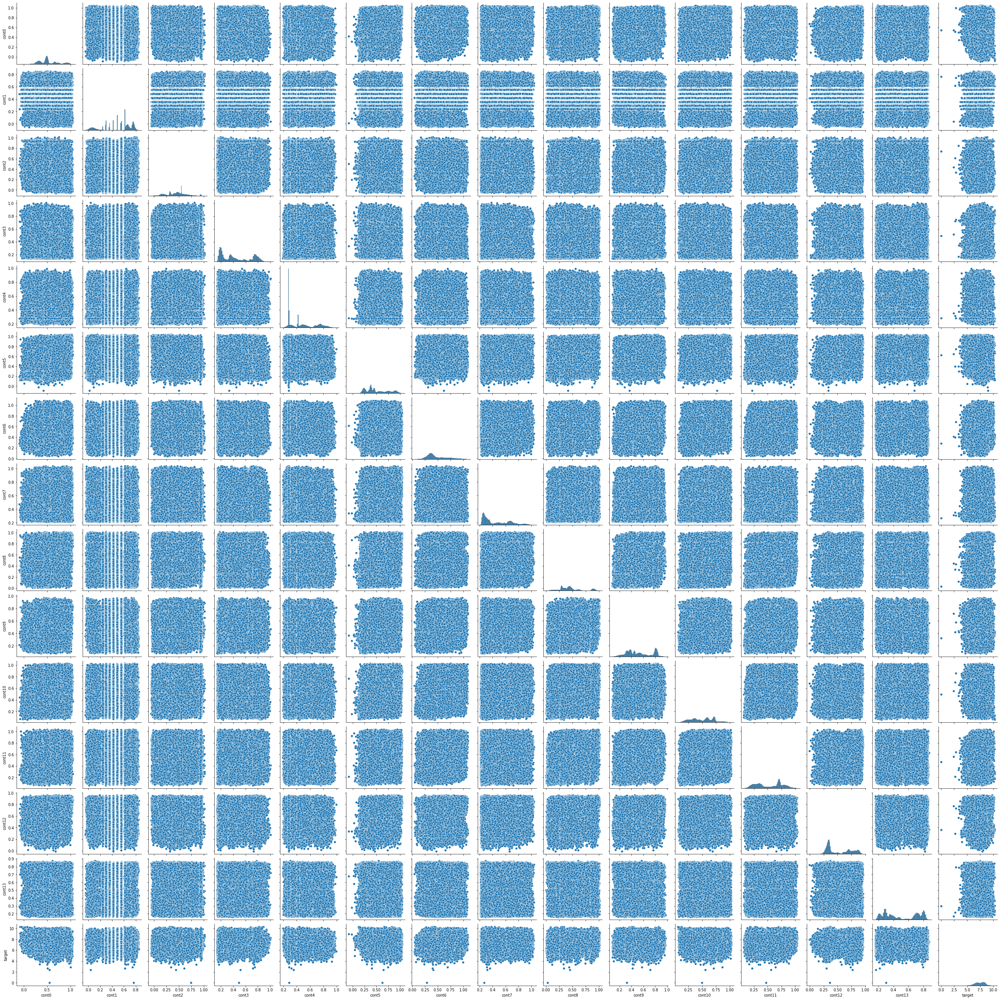

In [49]:
sns.pairplot(train[continuous_cols + ['target']])

cont1 column looks semi continuous and semi discrete. 

## joint train/test distribution plots

In [133]:
from viz import plot_histograms

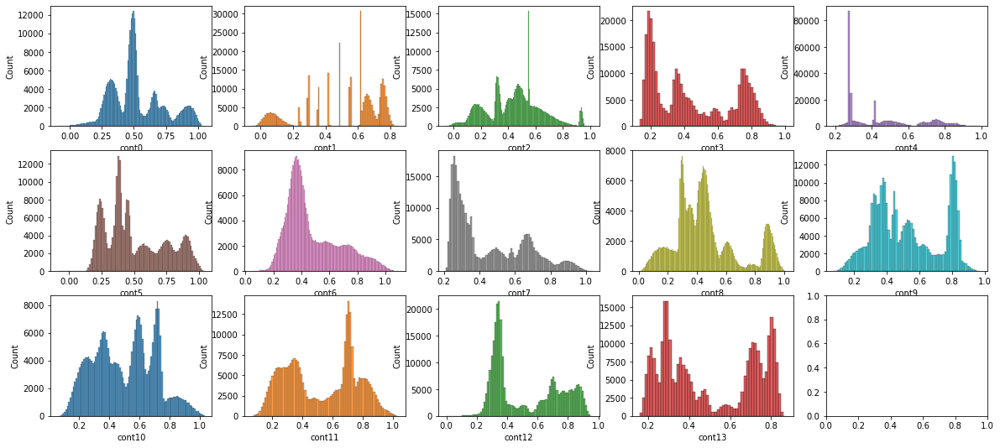

In [130]:
plot_histograms(train, continuous_cols, ncols=5)

## correlation plot

In [75]:
corr = train.corr()
fig = px.imshow(corr)
fig.show()

no correlation between the target and any of the predictors...

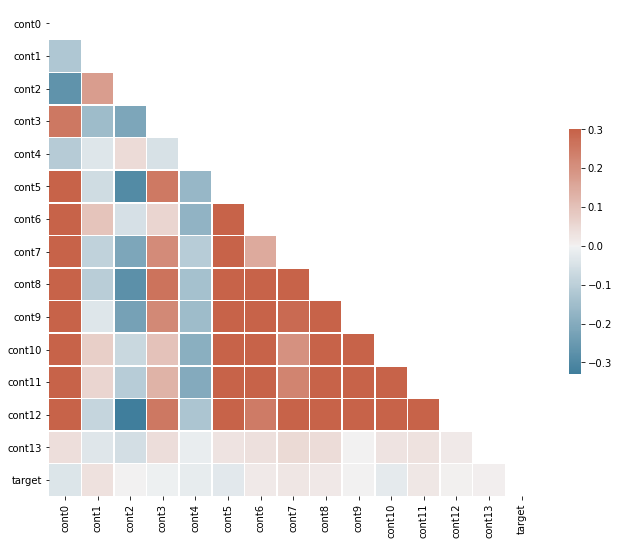

In [76]:
from viz import cor_plot
cor_plot(train[continuous_cols])

# setup pre-processing pipeline

In [158]:
# setup X and y
X = train.drop('target', 1)
y = train.target

In [169]:
## https://scikit-learn.org/stable/auto_examples/compose/plot_column_transformer_mixed_types.html

In [174]:
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector
from sklearn.datasets import fetch_openml
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, ElasticNetCV
from sklearn.metrics import mean_squared_error as MSE

In [ ]:
# cont transformer
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler()),
])

# cat transformer
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# setup preprocessing
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, make_column_selector(dtype_exclude="category")),
    ('cat', categorical_transformer, make_column_selector(dtype_include="category"))
])

# setup pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('regressor', LinearRegression())])

# train test split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=0, shuffle=True)

# fit
clf.fit(X_train, y_train)

# evaluate
y_pred = clf.predict(X_val)
print("RMSE=%.3f" % np.square(mean_squared_error(y_val, y_pred)))

## use k-fold CV w/ shuffle

In [183]:
from sklearn.model_selection import ShuffleSplit, cross_val_score
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=0)
scores = cross_val_score(clf, X, y, cv=cv, scoring='neg_root_mean_squared_error', verbose=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ............................... score: (test=-0.864) total time=   1.9s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.9s remaining:    0.0s


[CV] END ............................... score: (test=-0.863) total time=   1.8s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.8s remaining:    0.0s


[CV] END ............................... score: (test=-0.862) total time=   1.8s
[CV] END ............................... score: (test=-0.864) total time=   1.8s
[CV] END ............................... score: (test=-0.866) total time=   1.8s
[-0.86359333 -0.86310366 -0.86180428 -0.86355843 -0.86578231]
-0.8635684014977297
0.0012829824673703189


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    9.2s finished


In [191]:
print('%d-fold CV with average=%.3f and std=%.3f' % (len(scores), scores.mean(), scores.std()))

5-fold CV with average=-0.864 and std=0.001


Since standard deviation is low, we're generalizing across the training data set well. 

In [201]:
# submit results
submission = pd.read_csv('in/sample_submission.csv', index_col='id')
submission['target'] = clf.predict(test)
submission.to_csv('./out/linear_regression.csv')
submission.head()

,target
id,
0,7.554762
5,7.868421
15,7.637635
16,7.514306
17,7.329143


# are train and test data sets from the same distributions?

## check distributions of continuous columns

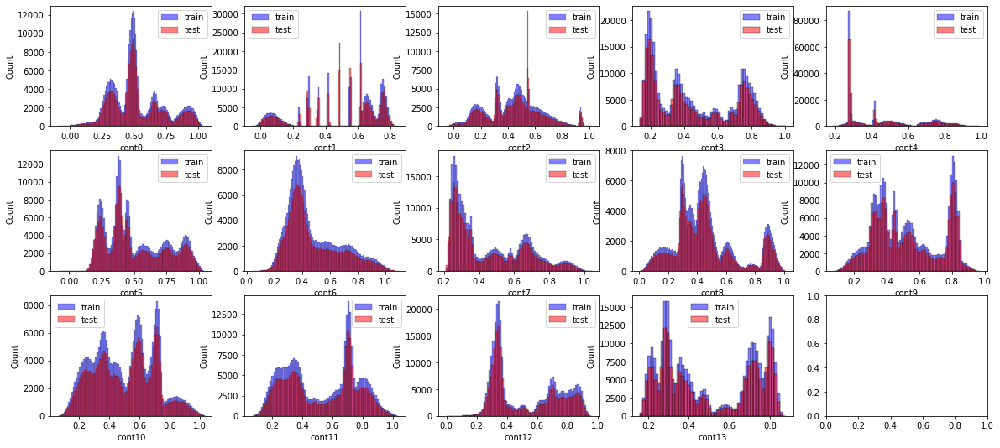

In [204]:
ncols = 5
cols = continuous_cols

nrows = math.ceil(len(cols) / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(20, nrows*3))
for i, col in enumerate(cols):
    ax = axes.flatten()[i]
    sns.histplot(train[col], ax=ax, label='train', alpha=0.5, color='b')
    sns.histplot(test[col], ax=ax, label='test', alpha=0.5, color='r')
    ax.set_xlabel(col)
    ax.legend()

No glaring discrepancies for the continuous columns...

## check distributions of categorical columns

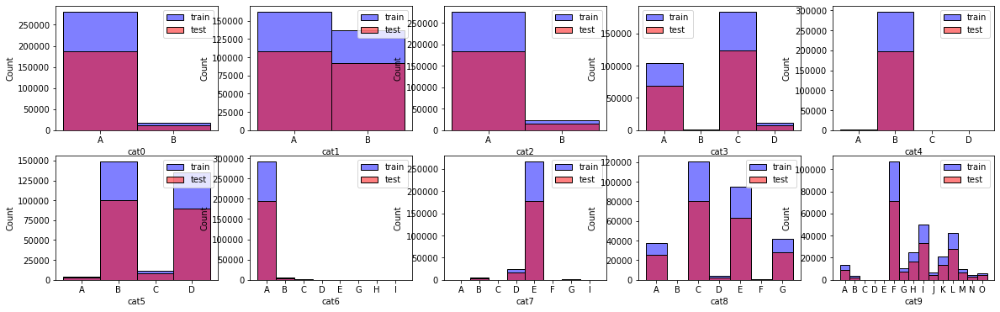

In [205]:
ncols = 5
cols = categorical_cols

nrows = math.ceil(len(cols) / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(20, nrows*3))
for i, col in enumerate(cols):
    ax = axes.flatten()[i]
    sns.histplot(train[col], ax=ax, label='train', alpha=0.5, color='b')
    sns.histplot(test[col], ax=ax, label='test', alpha=0.5, color='r')
    ax.set_xlabel(col)
    ax.legend()

Looks like the categorical columns differ quite a bit between train and test. 

# try catboost

In [44]:
from catboost import CatBoostRegressor, Pool, cv

In [45]:
model = CatBoostRegressor(loss_function='RMSE')

In [46]:
model.fit(
    X_train, 
    y_train,
    cat_features=np.where(X.dtypes != np.float)[0],
    eval_set=(X_validation, y_validation),
#     logging_level='Verbose',  # you can uncomment this for text output
    plot=True
);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.128248
0:	learn: 0.8827591	test: 0.8852717	best: 0.8852717 (0)	total: 355ms	remaining: 5m 54s
1:	learn: 0.8795277	test: 0.8818792	best: 0.8818792 (1)	total: 718ms	remaining: 5m 58s
2:	learn: 0.8769940	test: 0.8793421	best: 0.8793421 (2)	total: 899ms	remaining: 4m 58s
3:	learn: 0.8747903	test: 0.8771621	best: 0.8771621 (3)	total: 1.13s	remaining: 4m 40s
4:	learn: 0.8728276	test: 0.8751379	best: 0.8751379 (4)	total: 1.4s	remaining: 4m 39s
5:	learn: 0.8712573	test: 0.8735573	best: 0.8735573 (5)	total: 1.62s	remaining: 4m 28s
6:	learn: 0.8698458	test: 0.8720536	best: 0.8720536 (6)	total: 1.93s	remaining: 4m 34s
7:	learn: 0.8686488	test: 0.8708666	best: 0.8708666 (7)	total: 2.11s	remaining: 4m 22s
8:	learn: 0.8675633	test: 0.8697487	best: 0.8697487 (8)	total: 2.32s	remaining: 4m 15s
9:	learn: 0.8665453	test: 0.8685420	best: 0.8685420 (9)	total: 2.61s	remaining: 4m 18s
10:	learn: 0.8655603	test: 0.8675488	best: 0.8675488 (10)	total: 2.82s	remaining: 4m 13s
11:	learn: 0

93:	learn: 0.8467847	test: 0.8502357	best: 0.8502357 (93)	total: 20.9s	remaining: 3m 21s
94:	learn: 0.8466989	test: 0.8501759	best: 0.8501759 (94)	total: 21.2s	remaining: 3m 21s
95:	learn: 0.8466149	test: 0.8501148	best: 0.8501148 (95)	total: 21.4s	remaining: 3m 21s
96:	learn: 0.8465347	test: 0.8500598	best: 0.8500598 (96)	total: 21.6s	remaining: 3m 20s
97:	learn: 0.8464727	test: 0.8500096	best: 0.8500096 (97)	total: 21.8s	remaining: 3m 20s
98:	learn: 0.8463762	test: 0.8499649	best: 0.8499649 (98)	total: 22.1s	remaining: 3m 21s
99:	learn: 0.8462826	test: 0.8498838	best: 0.8498838 (99)	total: 22.3s	remaining: 3m 21s
100:	learn: 0.8462065	test: 0.8498231	best: 0.8498231 (100)	total: 22.6s	remaining: 3m 20s
101:	learn: 0.8461152	test: 0.8497375	best: 0.8497375 (101)	total: 22.8s	remaining: 3m 21s
102:	learn: 0.8460097	test: 0.8496683	best: 0.8496683 (102)	total: 23.1s	remaining: 3m 20s
103:	learn: 0.8459361	test: 0.8496281	best: 0.8496281 (103)	total: 23.2s	remaining: 3m 20s
104:	learn: 0

184:	learn: 0.8402507	test: 0.8466098	best: 0.8466098 (184)	total: 42.7s	remaining: 3m 8s
185:	learn: 0.8401953	test: 0.8465852	best: 0.8465852 (185)	total: 43s	remaining: 3m 8s
186:	learn: 0.8401526	test: 0.8465613	best: 0.8465613 (186)	total: 43.2s	remaining: 3m 7s
187:	learn: 0.8400964	test: 0.8465639	best: 0.8465613 (186)	total: 43.4s	remaining: 3m 7s
188:	learn: 0.8400509	test: 0.8465545	best: 0.8465545 (188)	total: 43.6s	remaining: 3m 7s
189:	learn: 0.8400085	test: 0.8465320	best: 0.8465320 (189)	total: 43.8s	remaining: 3m 6s
190:	learn: 0.8399540	test: 0.8465223	best: 0.8465223 (190)	total: 44.1s	remaining: 3m 6s
191:	learn: 0.8398867	test: 0.8465105	best: 0.8465105 (191)	total: 44.3s	remaining: 3m 6s
192:	learn: 0.8398245	test: 0.8464628	best: 0.8464628 (192)	total: 44.5s	remaining: 3m 6s
193:	learn: 0.8397795	test: 0.8464448	best: 0.8464448 (193)	total: 44.7s	remaining: 3m 5s
194:	learn: 0.8397121	test: 0.8464007	best: 0.8464007 (194)	total: 44.9s	remaining: 3m 5s
195:	learn: 

275:	learn: 0.8361119	test: 0.8454632	best: 0.8454632 (275)	total: 1m 3s	remaining: 2m 47s
276:	learn: 0.8360557	test: 0.8454590	best: 0.8454590 (276)	total: 1m 3s	remaining: 2m 46s
277:	learn: 0.8360012	test: 0.8454359	best: 0.8454359 (277)	total: 1m 4s	remaining: 2m 46s
278:	learn: 0.8359537	test: 0.8454419	best: 0.8454359 (277)	total: 1m 4s	remaining: 2m 46s
279:	learn: 0.8359050	test: 0.8454377	best: 0.8454359 (277)	total: 1m 4s	remaining: 2m 45s
280:	learn: 0.8358653	test: 0.8454264	best: 0.8454264 (280)	total: 1m 4s	remaining: 2m 45s
281:	learn: 0.8358201	test: 0.8454178	best: 0.8454178 (281)	total: 1m 5s	remaining: 2m 45s
282:	learn: 0.8357840	test: 0.8454153	best: 0.8454153 (282)	total: 1m 5s	remaining: 2m 45s
283:	learn: 0.8357228	test: 0.8454021	best: 0.8454021 (283)	total: 1m 5s	remaining: 2m 45s
284:	learn: 0.8356761	test: 0.8454066	best: 0.8454021 (283)	total: 1m 5s	remaining: 2m 44s
285:	learn: 0.8356408	test: 0.8453936	best: 0.8453936 (285)	total: 1m 5s	remaining: 2m 44s

366:	learn: 0.8327701	test: 0.8450041	best: 0.8450019 (365)	total: 1m 25s	remaining: 2m 27s
367:	learn: 0.8327440	test: 0.8449934	best: 0.8449934 (367)	total: 1m 25s	remaining: 2m 27s
368:	learn: 0.8326955	test: 0.8450057	best: 0.8449934 (367)	total: 1m 25s	remaining: 2m 27s
369:	learn: 0.8326547	test: 0.8450101	best: 0.8449934 (367)	total: 1m 26s	remaining: 2m 26s
370:	learn: 0.8326233	test: 0.8450133	best: 0.8449934 (367)	total: 1m 26s	remaining: 2m 26s
371:	learn: 0.8325746	test: 0.8450049	best: 0.8449934 (367)	total: 1m 26s	remaining: 2m 26s
372:	learn: 0.8325192	test: 0.8449907	best: 0.8449907 (372)	total: 1m 26s	remaining: 2m 26s
373:	learn: 0.8325149	test: 0.8449936	best: 0.8449907 (372)	total: 1m 27s	remaining: 2m 25s
374:	learn: 0.8324672	test: 0.8450024	best: 0.8449907 (372)	total: 1m 27s	remaining: 2m 25s
375:	learn: 0.8324546	test: 0.8450030	best: 0.8449907 (372)	total: 1m 27s	remaining: 2m 25s
376:	learn: 0.8324177	test: 0.8449970	best: 0.8449907 (372)	total: 1m 27s	remain

457:	learn: 0.8296290	test: 0.8448427	best: 0.8448423 (452)	total: 1m 45s	remaining: 2m 5s
458:	learn: 0.8295839	test: 0.8448381	best: 0.8448381 (458)	total: 1m 46s	remaining: 2m 5s
459:	learn: 0.8295490	test: 0.8448450	best: 0.8448381 (458)	total: 1m 46s	remaining: 2m 4s
460:	learn: 0.8295296	test: 0.8448545	best: 0.8448381 (458)	total: 1m 46s	remaining: 2m 4s
461:	learn: 0.8294906	test: 0.8448510	best: 0.8448381 (458)	total: 1m 46s	remaining: 2m 4s
462:	learn: 0.8294484	test: 0.8448384	best: 0.8448381 (458)	total: 1m 47s	remaining: 2m 4s
463:	learn: 0.8294282	test: 0.8448372	best: 0.8448372 (463)	total: 1m 47s	remaining: 2m 3s
464:	learn: 0.8293887	test: 0.8448375	best: 0.8448372 (463)	total: 1m 47s	remaining: 2m 3s
465:	learn: 0.8293476	test: 0.8448334	best: 0.8448334 (465)	total: 1m 47s	remaining: 2m 3s
466:	learn: 0.8293099	test: 0.8448425	best: 0.8448334 (465)	total: 1m 47s	remaining: 2m 3s
467:	learn: 0.8292629	test: 0.8448222	best: 0.8448222 (467)	total: 1m 48s	remaining: 2m 3s

547:	learn: 0.8267617	test: 0.8448359	best: 0.8448069 (506)	total: 2m 7s	remaining: 1m 45s
548:	learn: 0.8267532	test: 0.8448349	best: 0.8448069 (506)	total: 2m 7s	remaining: 1m 45s
549:	learn: 0.8267043	test: 0.8448300	best: 0.8448069 (506)	total: 2m 8s	remaining: 1m 44s
550:	learn: 0.8266611	test: 0.8448224	best: 0.8448069 (506)	total: 2m 8s	remaining: 1m 44s
551:	learn: 0.8266171	test: 0.8448196	best: 0.8448069 (506)	total: 2m 8s	remaining: 1m 44s
552:	learn: 0.8265837	test: 0.8448212	best: 0.8448069 (506)	total: 2m 8s	remaining: 1m 44s
553:	learn: 0.8265536	test: 0.8448185	best: 0.8448069 (506)	total: 2m 8s	remaining: 1m 43s
554:	learn: 0.8265363	test: 0.8448303	best: 0.8448069 (506)	total: 2m 9s	remaining: 1m 43s
555:	learn: 0.8264875	test: 0.8448522	best: 0.8448069 (506)	total: 2m 9s	remaining: 1m 43s
556:	learn: 0.8264689	test: 0.8448489	best: 0.8448069 (506)	total: 2m 9s	remaining: 1m 43s
557:	learn: 0.8264453	test: 0.8448519	best: 0.8448069 (506)	total: 2m 9s	remaining: 1m 42s

638:	learn: 0.8239308	test: 0.8449556	best: 0.8448069 (506)	total: 2m 28s	remaining: 1m 23s
639:	learn: 0.8239016	test: 0.8449638	best: 0.8448069 (506)	total: 2m 28s	remaining: 1m 23s
640:	learn: 0.8238649	test: 0.8449588	best: 0.8448069 (506)	total: 2m 28s	remaining: 1m 23s
641:	learn: 0.8238625	test: 0.8449580	best: 0.8448069 (506)	total: 2m 28s	remaining: 1m 22s
642:	learn: 0.8238331	test: 0.8449603	best: 0.8448069 (506)	total: 2m 29s	remaining: 1m 22s
643:	learn: 0.8237997	test: 0.8449613	best: 0.8448069 (506)	total: 2m 29s	remaining: 1m 22s
644:	learn: 0.8237819	test: 0.8449710	best: 0.8448069 (506)	total: 2m 29s	remaining: 1m 22s
645:	learn: 0.8237392	test: 0.8449800	best: 0.8448069 (506)	total: 2m 29s	remaining: 1m 22s
646:	learn: 0.8237005	test: 0.8449834	best: 0.8448069 (506)	total: 2m 30s	remaining: 1m 21s
647:	learn: 0.8236770	test: 0.8449810	best: 0.8448069 (506)	total: 2m 30s	remaining: 1m 21s
648:	learn: 0.8236458	test: 0.8449808	best: 0.8448069 (506)	total: 2m 30s	remain

728:	learn: 0.8215216	test: 0.8451118	best: 0.8448069 (506)	total: 2m 50s	remaining: 1m 3s
729:	learn: 0.8214876	test: 0.8451201	best: 0.8448069 (506)	total: 2m 50s	remaining: 1m 3s
730:	learn: 0.8214602	test: 0.8451328	best: 0.8448069 (506)	total: 2m 51s	remaining: 1m 2s
731:	learn: 0.8214453	test: 0.8451353	best: 0.8448069 (506)	total: 2m 51s	remaining: 1m 2s
732:	learn: 0.8214302	test: 0.8451284	best: 0.8448069 (506)	total: 2m 51s	remaining: 1m 2s
733:	learn: 0.8214220	test: 0.8451319	best: 0.8448069 (506)	total: 2m 51s	remaining: 1m 2s
734:	learn: 0.8213970	test: 0.8451365	best: 0.8448069 (506)	total: 2m 51s	remaining: 1m 2s
735:	learn: 0.8213856	test: 0.8451331	best: 0.8448069 (506)	total: 2m 52s	remaining: 1m 1s
736:	learn: 0.8213536	test: 0.8451267	best: 0.8448069 (506)	total: 2m 52s	remaining: 1m 1s
737:	learn: 0.8213205	test: 0.8451313	best: 0.8448069 (506)	total: 2m 52s	remaining: 1m 1s
738:	learn: 0.8212963	test: 0.8451299	best: 0.8448069 (506)	total: 2m 52s	remaining: 1m 1s

819:	learn: 0.8190305	test: 0.8451769	best: 0.8448069 (506)	total: 3m 10s	remaining: 41.9s
820:	learn: 0.8189958	test: 0.8451887	best: 0.8448069 (506)	total: 3m 11s	remaining: 41.7s
821:	learn: 0.8189616	test: 0.8452017	best: 0.8448069 (506)	total: 3m 11s	remaining: 41.4s
822:	learn: 0.8189600	test: 0.8452022	best: 0.8448069 (506)	total: 3m 11s	remaining: 41.2s
823:	learn: 0.8189321	test: 0.8451900	best: 0.8448069 (506)	total: 3m 11s	remaining: 41s
824:	learn: 0.8189039	test: 0.8451869	best: 0.8448069 (506)	total: 3m 11s	remaining: 40.7s
825:	learn: 0.8188915	test: 0.8451851	best: 0.8448069 (506)	total: 3m 12s	remaining: 40.5s
826:	learn: 0.8188551	test: 0.8451850	best: 0.8448069 (506)	total: 3m 12s	remaining: 40.2s
827:	learn: 0.8188318	test: 0.8451797	best: 0.8448069 (506)	total: 3m 12s	remaining: 40s
828:	learn: 0.8188019	test: 0.8451747	best: 0.8448069 (506)	total: 3m 12s	remaining: 39.8s
829:	learn: 0.8187729	test: 0.8451672	best: 0.8448069 (506)	total: 3m 12s	remaining: 39.5s
830

911:	learn: 0.8167608	test: 0.8453182	best: 0.8448069 (506)	total: 3m 30s	remaining: 20.3s
912:	learn: 0.8167150	test: 0.8453219	best: 0.8448069 (506)	total: 3m 30s	remaining: 20.1s
913:	learn: 0.8166775	test: 0.8453216	best: 0.8448069 (506)	total: 3m 30s	remaining: 19.8s
914:	learn: 0.8166729	test: 0.8453210	best: 0.8448069 (506)	total: 3m 30s	remaining: 19.6s
915:	learn: 0.8166444	test: 0.8453275	best: 0.8448069 (506)	total: 3m 31s	remaining: 19.4s
916:	learn: 0.8166052	test: 0.8453359	best: 0.8448069 (506)	total: 3m 31s	remaining: 19.1s
917:	learn: 0.8165843	test: 0.8453419	best: 0.8448069 (506)	total: 3m 31s	remaining: 18.9s
918:	learn: 0.8165509	test: 0.8453510	best: 0.8448069 (506)	total: 3m 31s	remaining: 18.7s
919:	learn: 0.8165408	test: 0.8453480	best: 0.8448069 (506)	total: 3m 32s	remaining: 18.4s
920:	learn: 0.8165196	test: 0.8453473	best: 0.8448069 (506)	total: 3m 32s	remaining: 18.2s
921:	learn: 0.8164881	test: 0.8453482	best: 0.8448069 (506)	total: 3m 32s	remaining: 18s
9